In [3]:
import numpy as np
import pandas as pd
import folium

## DataSet from 2019-04-08 to 2019-04-21


In [70]:
df = pd.read_parquet('/Users/danielyang/Downloads/city=Singapore/part-00000-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet')
df.dropna()
df['pingtimestamp'] = pd.to_datetime(df['pingtimestamp'], unit='s')
df

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy
0,70014,car,android,2019-04-11 00:40:36,1.342326,103.888969,18.910000,248,3.9
1,73573,car,android,2019-04-18 10:17:03,1.321781,103.856366,17.719076,44,4.0
2,75567,car,android,2019-04-13 07:37:06,1.327088,103.861273,14.021548,34,3.9
3,1410,car,android,2019-04-20 03:41:33,1.262482,103.823794,13.026521,181,4.0
4,4354,car,android,2019-04-18 10:48:17,1.283799,103.807210,14.812943,93,3.9
...,...,...,...,...,...,...,...,...,...
3034548,67126,car,android,2019-04-11 08:27:17,1.349722,103.792840,18.255438,93,6.0
3034549,11786,car,android,2019-04-14 13:25:52,1.386651,103.774858,23.341484,352,6.0
3034550,21686,car,ios,2019-04-21 00:15:14,1.329604,103.822454,23.468313,111,5.0
3034551,70139,car,android,2019-04-19 14:58:11,1.322202,103.886999,20.248346,266,6.0


In [17]:
# from 2019-04-08 to 2019-04-21
print(df["pingtimestamp"].min())
print(df["pingtimestamp"].max())


2019-04-21 23:56:37
2019-04-08 00:09:40


In [4]:
print(df.dtypes)

trj_id                   object
driving_mode             object
osname                   object
pingtimestamp    datetime64[ns]
rawlat                  float64
rawlng                  float64
speed                   float64
bearing                   int64
accuracy                float64
dtype: object


In [56]:
df.loc[df['trj_id'] == "70014"]

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy
0,70014,car,android,2019-04-11 00:40:36,1.342326,103.888969,18.91,248,3.900
13,70014,car,android,2019-04-11 00:41:13,1.341192,103.883078,13.25,293,3.900
28,70014,car,android,2019-04-11 00:39:26,1.339025,103.900562,20.52,287,3.900
107,70014,car,android,2019-04-11 00:40:25,1.342993,103.890802,19.47,251,3.900
157,70014,car,android,2019-04-11 00:36:54,1.347402,103.922990,20.01,247,3.900
...,...,...,...,...,...,...,...,...,...
15333,70014,car,android,2019-04-11 00:33:57,1.358887,103.930738,4.63,183,3.900
15412,70014,car,android,2019-04-11 00:46:25,1.339196,103.852475,0.00,0,3.000
15462,70014,car,android,2019-04-11 00:40:13,1.343120,103.892966,21.71,295,3.900
15567,70014,car,android,2019-04-11 00:27:27,1.371658,103.930389,2.63,183,3.363


## Folium Library

In [4]:
import pandas as pd
import folium
from folium.plugins import HeatMapWithTime
from folium.plugins import HeatMap

In [7]:
def generateBaseMap(default_location=[1.3521, 103.8198], default_zoom_start=11):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [8]:
base_map = generateBaseMap()
base_map

## HeatMap

In [9]:
HeatMap(data=df[['rawlat', 'rawlng']]. head(100000).groupby(['rawlat', 'rawlng']).sum().reset_index().values.tolist(), radius=8, max_zoom=13).add_to(base_map)

In [ ]:
import branca.colormap
from collections import defaultdict
import folium
from folium.plugins import HeatMap 


steps=20
colormap = branca.colormap.linear.BuGn_09.scale(0, 1).to_step(steps)
gradient_map=defaultdict(dict)
for i in range(steps):
    gradient_map[1/steps*i] = colormap.rgb_hex_str(1/steps*i)
colormap.add_to(base_map) #add color bar at the top of the map

base_map

In [ ]:
base_map

## Default heatmap (blue-green) 

In [11]:
import branca.colormap
from collections import defaultdict
import folium
from folium.plugins import HeatMap 


steps=20
colormap = branca.colormap.LinearColormap(("navy","lime"), index=None, vmin=0.0, vmax=1.0).to_step(steps)
colormap.add_to(base_map) #add color bar at the top of the map

base_map

## Heat map yellow red

In [12]:
base_map = generateBaseMap()
HeatMap(data=df[['rawlat', 'rawlng']]. head(100000).groupby(['rawlat', 'rawlng']).sum().reset_index().values.tolist(), radius=8, max_zoom=13, gradient={'0':'Navy', '0.25':'Yellow','0.5':'Orange', '0.75':'Red','1': 'Maroon'}).add_to(base_map)
base_map

In [14]:
steps=20
colormap = branca.colormap.linear.YlOrRd_09.scale(0, 1).to_step(steps)
gradient_map=defaultdict(dict)
for i in range(steps):
    gradient_map[1/steps*i] = colormap.rgb_hex_str(1/steps*i)
colormap.add_to(base_map) #add color bar at the top of the map

base_map

There has been feedback about delays in Grab transport services in both Jakarta and Singapore (late driver arrival -> late arrival at destination). This has led to a decrease in customer satisfaction and trust, which might increase customer turnover. Upon further research, it was found that this could be due to inaccurate ETA prediction, bad route planning, or other factors. Using the above dataset of GPS pings, what insights can your team obtain to help Grab alleviate these issues? 


## Frequency (popularity) of pickup locations for all trips in general

In [22]:
start_locations = df.sort_values(['pingtimestamp'],ascending=True).groupby('trj_id').head()[['trj_id','rawlat','rawlng']]
start_locations

,trj_id,rawlat,rawlng
2371260,70895,1.380403,103.770900
2368174,70895,1.380432,103.770924
2375481,70895,1.380443,103.770933
2276162,21926,1.291294,103.862687
1456786,47498,1.375407,103.736028
...,...,...,...
1963242,32449,1.342851,103.893598
2649278,4285,1.323066,103.864330
2644170,4285,1.323977,103.865038
2647066,4285,1.325886,103.866528


In [21]:
base_map = generateBaseMap()
HeatMap(data=start_locations[['rawlat', 'rawlng']].groupby(['rawlat', 'rawlng']).sum().reset_index().values.tolist(), radius=8, max_zoom=13, gradient={'0':'Navy', '0.25':'Yellow','0.5':'Orange', '0.75':'Red','1': 'Maroon'}).add_to(base_map)
base_map

## Heatmaps (Peak - non-peak hours)

In [94]:
grouped_df = df.sort_values(['pingtimestamp'],ascending=True).groupby("trj_id")
grouped_lists = grouped_df['pingtimestamp'].apply(list)
# grouped_lists = grouped_df['rawlat'].apply(list)
# grouped_lists = grouped_df['rawlng'].apply(list)
grouped_lists = grouped_lists.reset_index()
grouped_lists

,trj_id,pingtimestamp
0,10,"[2019-04-09 11:25:54, 2019-04-09 11:26:19, 201..."
1,100,"[2019-04-16 02:44:24, 2019-04-16 02:44:28, 201..."
2,1000,"[2019-04-11 00:49:45, 2019-04-11 00:49:54, 201..."
3,10001,"[2019-04-17 11:56:50, 2019-04-17 11:57:02, 201..."
4,10004,"[2019-04-09 03:12:39, 2019-04-09 03:12:41, 201..."
...,...,...
27995,997,"[2019-04-12 07:36:26, 2019-04-12 07:36:30, 201..."
27996,9970,"[2019-04-18 09:25:42, 2019-04-18 09:25:56, 201..."
27997,998,"[2019-04-18 22:30:33, 2019-04-18 22:30:49, 201..."
27998,9982,"[2019-04-09 16:22:24, 2019-04-09 16:22:25, 201..."


# Finalized table

In [12]:
grouped_lists = df.sort_values(['pingtimestamp'], ascending=True). groupby("trj_id").apply(lambda x: [list(x['pingtimestamp']), list(x['rawlat']), list(x['rawlng'])]).apply(pd.Series)
grouped_lists.columns = ['pingtimestamp', 'rawlat', 'rawlng']
grouped_lists=grouped_lists.reset_index()


In [13]:
grouped_lists.head()

,trj_id,pingtimestamp,rawlat,rawlng
0,10,"[2019-04-09 11:25:54, 2019-04-09 11:26:19, 201...","[1.3015806, 1.3007864, 1.3015228, 1.3016331, 1...","[103.7994312, 103.8004612, 103.8010567, 103.80..."
1,100,"[2019-04-16 02:44:24, 2019-04-16 02:44:28, 201...","[1.3441144179949875, 1.3435520539448285, 1.341...","[103.93837530870029, 103.93816274627387, 103.9..."
2,1000,"[2019-04-11 00:49:45, 2019-04-11 00:49:54, 201...","[1.4345152911682333, 1.4335090334743066, 1.431...","[103.78847410045273, 103.78819231944829, 103.7..."
3,10001,"[2019-04-17 11:56:50, 2019-04-17 11:57:02, 201...","[1.3750868, 1.3744014, 1.373885, 1.3717532, 1....","[103.8333768, 103.8330973, 103.8330595, 103.83..."
4,10004,"[2019-04-09 03:12:39, 2019-04-09 03:12:41, 201...","[1.4333477185424202, 1.432968829124785, 1.4312...","[103.76874144270963, 103.76879075871467, 103.7..."


In [14]:
grouped_lists['start_time'] = grouped_lists.apply(lambda row: min(row['pingtimestamp']), axis = 1)
grouped_lists['end_time'] = grouped_lists.apply(lambda row: max(row['pingtimestamp']), axis = 1)
grouped_lists['ETA'] = grouped_lists.apply(lambda row: row['end_time']-row['start_time'], axis = 1)

In [15]:
grouped_lists

,trj_id,pingtimestamp,rawlat,rawlng,start_time,end_time,ETA
0,10,"[2019-04-09 11:25:54, 2019-04-09 11:26:19, 201...","[1.3015806, 1.3007864, 1.3015228, 1.3016331, 1...","[103.7994312, 103.8004612, 103.8010567, 103.80...",2019-04-09 11:25:54,2019-04-09 11:44:54,00:19:00
1,100,"[2019-04-16 02:44:24, 2019-04-16 02:44:28, 201...","[1.3441144179949875, 1.3435520539448285, 1.341...","[103.93837530870029, 103.93816274627387, 103.9...",2019-04-16 02:44:24,2019-04-16 03:00:37,00:16:13
2,1000,"[2019-04-11 00:49:45, 2019-04-11 00:49:54, 201...","[1.4345152911682333, 1.4335090334743066, 1.431...","[103.78847410045273, 103.78819231944829, 103.7...",2019-04-11 00:49:45,2019-04-11 01:03:22,00:13:37
3,10001,"[2019-04-17 11:56:50, 2019-04-17 11:57:02, 201...","[1.3750868, 1.3744014, 1.373885, 1.3717532, 1....","[103.8333768, 103.8330973, 103.8330595, 103.83...",2019-04-17 11:56:50,2019-04-17 12:17:05,00:20:15
4,10004,"[2019-04-09 03:12:39, 2019-04-09 03:12:41, 201...","[1.4333477185424202, 1.432968829124785, 1.4312...","[103.76874144270963, 103.76879075871467, 103.7...",2019-04-09 03:12:39,2019-04-09 03:26:37,00:13:58
...,...,...,...,...,...,...,...
27995,997,"[2019-04-12 07:36:26, 2019-04-12 07:36:30, 201...","[1.3189282541918728, 1.3189831875076936, 1.319...","[103.8478292978487, 103.84811999947114, 103.84...",2019-04-12 07:36:26,2019-04-12 07:56:08,00:19:42
27996,9970,"[2019-04-18 09:25:42, 2019-04-18 09:25:56, 201...","[1.4347926, 1.4336828, 1.4334373, 1.4332008, 1...","[103.7884814, 103.7882335, 103.7881672, 103.78...",2019-04-18 09:25:42,2019-04-18 09:54:53,00:29:11
27997,998,"[2019-04-18 22:30:33, 2019-04-18 22:30:49, 201...","[1.3347523501206355, 1.3347026637897397, 1.332...","[103.69888428098972, 103.69735041579374, 103.6...",2019-04-18 22:30:33,2019-04-18 22:51:01,00:20:28
27998,9982,"[2019-04-09 16:22:24, 2019-04-09 16:22:25, 201...","[1.2845048669894314, 1.2843978242614489, 1.284...","[103.84660132053966, 103.84653677507633, 103.8...",2019-04-09 16:22:24,2019-04-09 16:41:03,00:18:39


### Distance travelled column

In [7]:
import geopy.distance

In [8]:
def calc_distance(row):
    distance = 0
    lat = row['rawlat']
    lng = row['rawlng']
    for i in range(0,len(lat)-1):
        distance += geopy.distance.geodesic((lat[i],lng[i]),(lat[i+1],lng[i+1])).km
    return distance


In [119]:
test = grouped_lists.head()
test

,trj_id,pingtimestamp,rawlat,rawlng,start_time,end_time,ETA
0,10,"[2019-04-09 11:25:54, 2019-04-09 11:26:19, 201...","[1.3015806, 1.3007864, 1.3015228, 1.3016331, 1...","[103.7994312, 103.8004612, 103.8010567, 103.80...",2019-04-09 11:25:54,2019-04-09 11:44:54,00:19:00
1,100,"[2019-04-16 02:44:24, 2019-04-16 02:44:28, 201...","[1.3441144179949875, 1.3435520539448285, 1.341...","[103.93837530870029, 103.93816274627387, 103.9...",2019-04-16 02:44:24,2019-04-16 03:00:37,00:16:13
2,1000,"[2019-04-11 00:49:45, 2019-04-11 00:49:54, 201...","[1.4345152911682333, 1.4335090334743066, 1.431...","[103.78847410045273, 103.78819231944829, 103.7...",2019-04-11 00:49:45,2019-04-11 01:03:22,00:13:37
3,10001,"[2019-04-17 11:56:50, 2019-04-17 11:57:02, 201...","[1.3750868, 1.3744014, 1.373885, 1.3717532, 1....","[103.8333768, 103.8330973, 103.8330595, 103.83...",2019-04-17 11:56:50,2019-04-17 12:17:05,00:20:15
4,10004,"[2019-04-09 03:12:39, 2019-04-09 03:12:41, 201...","[1.4333477185424202, 1.432968829124785, 1.4312...","[103.76874144270963, 103.76879075871467, 103.7...",2019-04-09 03:12:39,2019-04-09 03:26:37,00:13:58


In [16]:
test['distance'] = test.apply(lambda row: calc_distance(row), axis = 1)
test

NameError: name 'test' is not defined

In [17]:
grouped_lists['distance'] = grouped_lists.apply(lambda row: calc_distance(row), axis = 1)
grouped_lists

,trj_id,pingtimestamp,rawlat,rawlng,start_time,end_time,ETA,distance
0,10,"[2019-04-09 11:25:54, 2019-04-09 11:26:19, 201...","[1.3015806, 1.3007864, 1.3015228, 1.3016331, 1...","[103.7994312, 103.8004612, 103.8010567, 103.80...",2019-04-09 11:25:54,2019-04-09 11:44:54,00:19:00,9.875596
1,100,"[2019-04-16 02:44:24, 2019-04-16 02:44:28, 201...","[1.3441144179949875, 1.3435520539448285, 1.341...","[103.93837530870029, 103.93816274627387, 103.9...",2019-04-16 02:44:24,2019-04-16 03:00:37,00:16:13,12.813825
2,1000,"[2019-04-11 00:49:45, 2019-04-11 00:49:54, 201...","[1.4345152911682333, 1.4335090334743066, 1.431...","[103.78847410045273, 103.78819231944829, 103.7...",2019-04-11 00:49:45,2019-04-11 01:03:22,00:13:37,13.478591
3,10001,"[2019-04-17 11:56:50, 2019-04-17 11:57:02, 201...","[1.3750868, 1.3744014, 1.373885, 1.3717532, 1....","[103.8333768, 103.8330973, 103.8330595, 103.83...",2019-04-17 11:56:50,2019-04-17 12:17:05,00:20:15,16.901128
4,10004,"[2019-04-09 03:12:39, 2019-04-09 03:12:41, 201...","[1.4333477185424202, 1.432968829124785, 1.4312...","[103.76874144270963, 103.76879075871467, 103.7...",2019-04-09 03:12:39,2019-04-09 03:26:37,00:13:58,18.371995
...,...,...,...,...,...,...,...,...
27995,997,"[2019-04-12 07:36:26, 2019-04-12 07:36:30, 201...","[1.3189282541918728, 1.3189831875076936, 1.319...","[103.8478292978487, 103.84811999947114, 103.84...",2019-04-12 07:36:26,2019-04-12 07:56:08,00:19:42,16.939484
27996,9970,"[2019-04-18 09:25:42, 2019-04-18 09:25:56, 201...","[1.4347926, 1.4336828, 1.4334373, 1.4332008, 1...","[103.7884814, 103.7882335, 103.7881672, 103.78...",2019-04-18 09:25:42,2019-04-18 09:54:53,00:29:11,20.108965
27997,998,"[2019-04-18 22:30:33, 2019-04-18 22:30:49, 201...","[1.3347523501206355, 1.3347026637897397, 1.332...","[103.69888428098972, 103.69735041579374, 103.6...",2019-04-18 22:30:33,2019-04-18 22:51:01,00:20:28,21.943726
27998,9982,"[2019-04-09 16:22:24, 2019-04-09 16:22:25, 201...","[1.2845048669894314, 1.2843978242614489, 1.284...","[103.84660132053966, 103.84653677507633, 103.8...",2019-04-09 16:22:24,2019-04-09 16:41:03,00:18:39,23.759358


In [124]:
df1 = grouped_lists[['trj_id', 'start_time', 'ETA', 'distance']]
df1

,trj_id,start_time,ETA,distance
0,10,2019-04-09 11:25:54,00:19:00,9.875596
1,100,2019-04-16 02:44:24,00:16:13,12.813825
2,1000,2019-04-11 00:49:45,00:13:37,13.478591
3,10001,2019-04-17 11:56:50,00:20:15,16.901128
4,10004,2019-04-09 03:12:39,00:13:58,18.371995
...,...,...,...,...
27995,997,2019-04-12 07:36:26,00:19:42,16.939484
27996,9970,2019-04-18 09:25:42,00:29:11,20.108965
27997,998,2019-04-18 22:30:33,00:20:28,21.943726
27998,9982,2019-04-09 16:22:24,00:18:39,23.759358


In [125]:
df2 = pd.read_parquet('/Users/danielyang/Downloads/city=Singapore/part-00000-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet')
df2.dropna()
df2['pingtimestamp'] = pd.to_datetime(df['pingtimestamp'], unit='s')
df2

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy
0,70014,car,android,2019-04-11 00:40:36,1.342326,103.888969,18.910000,248,3.9
1,73573,car,android,2019-04-18 10:17:03,1.321781,103.856366,17.719076,44,4.0
2,75567,car,android,2019-04-13 07:37:06,1.327088,103.861273,14.021548,34,3.9
3,1410,car,android,2019-04-20 03:41:33,1.262482,103.823794,13.026521,181,4.0
4,4354,car,android,2019-04-18 10:48:17,1.283799,103.807210,14.812943,93,3.9
...,...,...,...,...,...,...,...,...,...
3034548,67126,car,android,2019-04-11 08:27:17,1.349722,103.792840,18.255438,93,6.0
3034549,11786,car,android,2019-04-14 13:25:52,1.386651,103.774858,23.341484,352,6.0
3034550,21686,car,ios,2019-04-21 00:15:14,1.329604,103.822454,23.468313,111,5.0
3034551,70139,car,android,2019-04-19 14:58:11,1.322202,103.886999,20.248346,266,6.0


In [ ]:
# import os  
# os.makedirs('/Users/danielyang/Downloads', exist_ok=True)  
# df.to_csv('data.csv')  
# df.to_csv(index=False)

In [5]:
df_travel = pd.read_csv('/Users/danielyang/Downloads/Telegram Desktop/trip_info.csv')
df_travel

,Unnamed: 0,trj_id,start_time,end_time,ETA,start_lat,end_lat,start_lng,end_lng,distance
0,0,10,2019-04-09 11:25:54,2019-04-09 11:44:54,0 days 00:19:00,1.301581,1.358010,103.799431,103.845159,9.875596
1,1,100,2019-04-16 02:44:24,2019-04-16 03:00:37,0 days 00:16:13,1.344114,1.335289,103.938375,103.843102,12.813825
2,2,1000,2019-04-11 00:49:45,2019-04-11 01:03:22,0 days 00:13:37,1.434515,1.370538,103.788474,103.860748,13.478591
3,3,10001,2019-04-17 11:56:50,2019-04-17 12:17:05,0 days 00:20:15,1.375087,1.328267,103.833377,103.750637,16.901128
4,4,10004,2019-04-09 03:12:39,2019-04-09 03:26:37,0 days 00:13:58,1.433348,1.393925,103.768741,103.907360,18.371995
...,...,...,...,...,...,...,...,...,...,...
27995,27995,997,2019-04-12 07:36:26,2019-04-12 07:56:08,0 days 00:19:42,1.318928,1.368076,103.847829,103.945997,16.939484
27996,27996,9970,2019-04-18 09:25:42,2019-04-18 09:54:53,0 days 00:29:11,1.434793,1.316889,103.788481,103.873316,20.108965
27997,27997,998,2019-04-18 22:30:33,2019-04-18 22:51:01,0 days 00:20:28,1.334752,1.296571,103.698884,103.852597,21.943726
27998,27998,9982,2019-04-09 16:22:24,2019-04-09 16:41:03,0 days 00:18:39,1.284505,1.425779,103.846601,103.787880,23.759358


In [18]:
grouped_lists

,trj_id,pingtimestamp,rawlat,rawlng,start_time,end_time,ETA,distance
0,10,"[2019-04-09 11:25:54, 2019-04-09 11:26:19, 201...","[1.3015806, 1.3007864, 1.3015228, 1.3016331, 1...","[103.7994312, 103.8004612, 103.8010567, 103.80...",2019-04-09 11:25:54,2019-04-09 11:44:54,00:19:00,9.875596
1,100,"[2019-04-16 02:44:24, 2019-04-16 02:44:28, 201...","[1.3441144179949875, 1.3435520539448285, 1.341...","[103.93837530870029, 103.93816274627387, 103.9...",2019-04-16 02:44:24,2019-04-16 03:00:37,00:16:13,12.813825
2,1000,"[2019-04-11 00:49:45, 2019-04-11 00:49:54, 201...","[1.4345152911682333, 1.4335090334743066, 1.431...","[103.78847410045273, 103.78819231944829, 103.7...",2019-04-11 00:49:45,2019-04-11 01:03:22,00:13:37,13.478591
3,10001,"[2019-04-17 11:56:50, 2019-04-17 11:57:02, 201...","[1.3750868, 1.3744014, 1.373885, 1.3717532, 1....","[103.8333768, 103.8330973, 103.8330595, 103.83...",2019-04-17 11:56:50,2019-04-17 12:17:05,00:20:15,16.901128
4,10004,"[2019-04-09 03:12:39, 2019-04-09 03:12:41, 201...","[1.4333477185424202, 1.432968829124785, 1.4312...","[103.76874144270963, 103.76879075871467, 103.7...",2019-04-09 03:12:39,2019-04-09 03:26:37,00:13:58,18.371995
...,...,...,...,...,...,...,...,...
27995,997,"[2019-04-12 07:36:26, 2019-04-12 07:36:30, 201...","[1.3189282541918728, 1.3189831875076936, 1.319...","[103.8478292978487, 103.84811999947114, 103.84...",2019-04-12 07:36:26,2019-04-12 07:56:08,00:19:42,16.939484
27996,9970,"[2019-04-18 09:25:42, 2019-04-18 09:25:56, 201...","[1.4347926, 1.4336828, 1.4334373, 1.4332008, 1...","[103.7884814, 103.7882335, 103.7881672, 103.78...",2019-04-18 09:25:42,2019-04-18 09:54:53,00:29:11,20.108965
27997,998,"[2019-04-18 22:30:33, 2019-04-18 22:30:49, 201...","[1.3347523501206355, 1.3347026637897397, 1.332...","[103.69888428098972, 103.69735041579374, 103.6...",2019-04-18 22:30:33,2019-04-18 22:51:01,00:20:28,21.943726
27998,9982,"[2019-04-09 16:22:24, 2019-04-09 16:22:25, 201...","[1.2845048669894314, 1.2843978242614489, 1.284...","[103.84660132053966, 103.84653677507633, 103.8...",2019-04-09 16:22:24,2019-04-09 16:41:03,00:18:39,23.759358


In [20]:
grouped_lists['hours'] = grouped_lists['start_time'].dt.hour
grouped_lists

,trj_id,pingtimestamp,rawlat,rawlng,start_time,end_time,ETA,distance,hours
0,10,"[2019-04-09 11:25:54, 2019-04-09 11:26:19, 201...","[1.3015806, 1.3007864, 1.3015228, 1.3016331, 1...","[103.7994312, 103.8004612, 103.8010567, 103.80...",2019-04-09 11:25:54,2019-04-09 11:44:54,00:19:00,9.875596,11
1,100,"[2019-04-16 02:44:24, 2019-04-16 02:44:28, 201...","[1.3441144179949875, 1.3435520539448285, 1.341...","[103.93837530870029, 103.93816274627387, 103.9...",2019-04-16 02:44:24,2019-04-16 03:00:37,00:16:13,12.813825,2
2,1000,"[2019-04-11 00:49:45, 2019-04-11 00:49:54, 201...","[1.4345152911682333, 1.4335090334743066, 1.431...","[103.78847410045273, 103.78819231944829, 103.7...",2019-04-11 00:49:45,2019-04-11 01:03:22,00:13:37,13.478591,0
3,10001,"[2019-04-17 11:56:50, 2019-04-17 11:57:02, 201...","[1.3750868, 1.3744014, 1.373885, 1.3717532, 1....","[103.8333768, 103.8330973, 103.8330595, 103.83...",2019-04-17 11:56:50,2019-04-17 12:17:05,00:20:15,16.901128,11
4,10004,"[2019-04-09 03:12:39, 2019-04-09 03:12:41, 201...","[1.4333477185424202, 1.432968829124785, 1.4312...","[103.76874144270963, 103.76879075871467, 103.7...",2019-04-09 03:12:39,2019-04-09 03:26:37,00:13:58,18.371995,3
...,...,...,...,...,...,...,...,...,...
27995,997,"[2019-04-12 07:36:26, 2019-04-12 07:36:30, 201...","[1.3189282541918728, 1.3189831875076936, 1.319...","[103.8478292978487, 103.84811999947114, 103.84...",2019-04-12 07:36:26,2019-04-12 07:56:08,00:19:42,16.939484,7
27996,9970,"[2019-04-18 09:25:42, 2019-04-18 09:25:56, 201...","[1.4347926, 1.4336828, 1.4334373, 1.4332008, 1...","[103.7884814, 103.7882335, 103.7881672, 103.78...",2019-04-18 09:25:42,2019-04-18 09:54:53,00:29:11,20.108965,9
27997,998,"[2019-04-18 22:30:33, 2019-04-18 22:30:49, 201...","[1.3347523501206355, 1.3347026637897397, 1.332...","[103.69888428098972, 103.69735041579374, 103.6...",2019-04-18 22:30:33,2019-04-18 22:51:01,00:20:28,21.943726,22
27998,9982,"[2019-04-09 16:22:24, 2019-04-09 16:22:25, 201...","[1.2845048669894314, 1.2843978242614489, 1.284...","[103.84660132053966, 103.84653677507633, 103.8...",2019-04-09 16:22:24,2019-04-09 16:41:03,00:18:39,23.759358,16


In [21]:
PIE = [(1.346989, 103.799029), (1.345189, 103.800712), (1.343419, 103.802399), (1.341306, 103.804330),(1.347215, 103.798436),(1.344876, 103.800672), (1.342935, 103.802539), (1.340892, 103.804369)]
PIE_lat_start = 1.3413
PIE_lat_end = 1.3469
PIE_lng_start = 103.799029
PIE_lng_end = 103.804330

In [38]:
b = df.sort_values(['pingtimestamp'],ascending=True).groupby('trj_id').head()['pingtimestamp'].dt.hour
b

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy
2371260,70895,car,android,2019-04-08 00:09:40,1.380403,103.770900,6.799661,41,4.000
2368174,70895,car,android,2019-04-08 00:09:41,1.380432,103.770924,4.931891,39,4.000
2375481,70895,car,android,2019-04-08 00:09:42,1.380443,103.770933,3.228720,39,3.653
2276162,21926,car,android,2019-04-08 00:09:49,1.291294,103.862687,10.812810,68,4.000
1456786,47498,car,ios,2019-04-08 00:09:52,1.375407,103.736028,18.307493,307,8.000
...,...,...,...,...,...,...,...,...,...
1963242,32449,car,android,2019-04-21 23:34:06,1.342851,103.893598,18.940000,124,3.900
2649278,4285,car,ios,2019-04-21 23:34:43,1.323066,103.864330,15.582464,310,10.000
2644170,4285,car,ios,2019-04-21 23:34:51,1.323977,103.865038,14.784204,313,8.000
2647066,4285,car,ios,2019-04-21 23:35:17,1.325886,103.866528,8.549109,312,5.000


### PIE exit 22-24 

In [39]:
b['hours'] = b['pingtimestamp'].dt.hour
b

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy,hours
2371260,70895,car,android,2019-04-08 00:09:40,1.380403,103.770900,6.799661,41,4.000,0
2368174,70895,car,android,2019-04-08 00:09:41,1.380432,103.770924,4.931891,39,4.000,0
2375481,70895,car,android,2019-04-08 00:09:42,1.380443,103.770933,3.228720,39,3.653,0
2276162,21926,car,android,2019-04-08 00:09:49,1.291294,103.862687,10.812810,68,4.000,0
1456786,47498,car,ios,2019-04-08 00:09:52,1.375407,103.736028,18.307493,307,8.000,0
...,...,...,...,...,...,...,...,...,...,...
1963242,32449,car,android,2019-04-21 23:34:06,1.342851,103.893598,18.940000,124,3.900,23
2649278,4285,car,ios,2019-04-21 23:34:43,1.323066,103.864330,15.582464,310,10.000,23
2644170,4285,car,ios,2019-04-21 23:34:51,1.323977,103.865038,14.784204,313,8.000,23
2647066,4285,car,ios,2019-04-21 23:35:17,1.325886,103.866528,8.549109,312,5.000,23


In [60]:
c = b[b['hours'].isin([8,9,17,18,19])]
c

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy,hours
2718375,75968,car,ios,2019-04-08 08:00:00,1.365645,103.945800,10.750000,357,10.0,8
2227826,62107,car,android,2019-04-08 08:00:14,1.345427,103.702537,1.540127,325,3.0,8
2226181,62107,car,android,2019-04-08 08:00:17,1.345452,103.702523,1.078198,325,3.0,8
2707587,75968,car,ios,2019-04-08 08:00:17,1.367085,103.944752,15.470000,333,10.0,8
1720724,65366,car,android,2019-04-08 08:00:30,1.347067,103.704907,0.000000,0,3.0,8
...,...,...,...,...,...,...,...,...,...,...
2323490,77797,car,ios,2019-04-21 19:57:52,1.338233,103.981128,15.888206,154,8.0,19
2330796,77797,car,ios,2019-04-21 19:57:56,1.337829,103.981492,13.437848,160,8.0,19
2326124,77797,car,ios,2019-04-21 19:58:02,1.337227,103.981458,13.040980,213,8.0,19
2324724,77797,car,ios,2019-04-21 19:58:17,1.337045,103.979652,16.112402,292,8.0,19


In [61]:
c = c[c['rawlng'].between(103.779029, 103.804330)]
c = c[c['rawlat'].between(1.3410, 1.3478)]
c

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy,hours
1144719,42253,car,android,2019-04-10 08:31:16,1.344282,103.786315,14.776805,68,3.9,8
1148321,42253,car,android,2019-04-10 08:31:22,1.344626,103.787104,16.776527,61,3.9,8
2989680,71710,car,android,2019-04-12 08:10:38,1.342001,103.789843,4.450000,153,3.9,8
538729,45185,car,android,2019-04-12 08:23:16,1.341195,103.779087,19.270000,36,3.9,8
541120,45185,car,android,2019-04-12 08:23:24,1.342025,103.780211,20.080000,65,3.9,8
538374,45185,car,android,2019-04-12 08:24:01,1.344583,103.787130,20.940000,62,3.9,8
2963545,65203,car,android,2019-04-12 08:41:28,1.342507,103.780097,15.882544,99,4.0,8
2973958,65203,car,android,2019-04-12 08:41:32,1.342429,103.780661,16.660572,87,4.0,8
2970924,65203,car,android,2019-04-12 08:41:40,1.342687,103.781750,14.900392,73,4.0,8
1031511,81836,car,ios,2019-04-12 19:13:24,1.342564,103.781193,21.978180,76,12.0,19


In [97]:
peak_avg_speed = sum(c['speed'])
peak_avg_speed = (peak_avg_speed/len(c['speed']))*(3600/1000)
print("PIE peak", peak_avg_speed)

PIE peak 58.1253033254068


In [63]:
d = b[b['hours'].isin([0,1,2,3,4,5,6,7,10,11,12,13,14,15,16,20,21,22,23])]
d

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy,hours
2371260,70895,car,android,2019-04-08 00:09:40,1.380403,103.770900,6.799661,41,4.000,0
2368174,70895,car,android,2019-04-08 00:09:41,1.380432,103.770924,4.931891,39,4.000,0
2375481,70895,car,android,2019-04-08 00:09:42,1.380443,103.770933,3.228720,39,3.653,0
2276162,21926,car,android,2019-04-08 00:09:49,1.291294,103.862687,10.812810,68,4.000,0
1456786,47498,car,ios,2019-04-08 00:09:52,1.375407,103.736028,18.307493,307,8.000,0
...,...,...,...,...,...,...,...,...,...,...
1963242,32449,car,android,2019-04-21 23:34:06,1.342851,103.893598,18.940000,124,3.900,23
2649278,4285,car,ios,2019-04-21 23:34:43,1.323066,103.864330,15.582464,310,10.000,23
2644170,4285,car,ios,2019-04-21 23:34:51,1.323977,103.865038,14.784204,313,8.000,23
2647066,4285,car,ios,2019-04-21 23:35:17,1.325886,103.866528,8.549109,312,5.000,23


In [64]:
d = d[d['rawlng'].between(103.779029, 103.804330)]
d = d[d['rawlat'].between(1.3410, 1.3478)]
d

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy,hours
794629,69609,car,android,2019-04-08 02:51:31,1.342642,103.779386,14.669933,82,3.9,2
783931,69609,car,android,2019-04-08 02:51:35,1.342628,103.779957,15.485820,96,4.0,2
788047,69609,car,android,2019-04-08 02:51:39,1.342559,103.780552,17.018934,91,4.0,2
974107,1068,car,ios,2019-04-08 06:05:30,1.342602,103.779465,14.691336,91,6.0,6
973267,1068,car,ios,2019-04-08 06:05:34,1.342520,103.780021,16.313643,99,6.0,6
...,...,...,...,...,...,...,...,...,...,...
2051463,63607,car,ios,2019-04-21 15:28:46,1.343182,103.783175,18.530001,68,10.0,15
2281742,27251,car,android,2019-04-21 16:20:55,1.347758,103.792843,16.530000,258,11.0,16
922561,70767,car,ios,2019-04-21 20:46:52,1.342544,103.780068,19.650000,81,10.0,20
920962,70767,car,ios,2019-04-21 20:46:56,1.342519,103.780810,21.260000,63,10.0,20


In [99]:
nonpeak_avg_speed = sum(d['speed'])
nonpeak_avg_speed = (nonpeak_avg_speed/len(d['speed']))*(3600/1000)
print("PIE nonpeak", nonpeak_avg_speed)

PIE nonpeak 55.689865327045055


### BKE Exit 1-3

In [67]:
1.361678, 103.780477
1.351465, 103.790229

(1.351465, 103.790229)

In [76]:
df = pd.read_parquet('/Users/danielyang/Downloads/city=Singapore/part-00000-8bbff892-97d2-4011-9961-703e38972569.c000.snappy.parquet')
df.dropna()
df['pingtimestamp'] = pd.to_datetime(df['pingtimestamp'], unit='s')
df

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy
0,70014,car,android,2019-04-11 00:40:36,1.342326,103.888969,18.910000,248,3.9
1,73573,car,android,2019-04-18 10:17:03,1.321781,103.856366,17.719076,44,4.0
2,75567,car,android,2019-04-13 07:37:06,1.327088,103.861273,14.021548,34,3.9
3,1410,car,android,2019-04-20 03:41:33,1.262482,103.823794,13.026521,181,4.0
4,4354,car,android,2019-04-18 10:48:17,1.283799,103.807210,14.812943,93,3.9
...,...,...,...,...,...,...,...,...,...
3034548,67126,car,android,2019-04-11 08:27:17,1.349722,103.792840,18.255438,93,6.0
3034549,11786,car,android,2019-04-14 13:25:52,1.386651,103.774858,23.341484,352,6.0
3034550,21686,car,ios,2019-04-21 00:15:14,1.329604,103.822454,23.468313,111,5.0
3034551,70139,car,android,2019-04-19 14:58:11,1.322202,103.886999,20.248346,266,6.0


In [82]:
df['hours'] = df['pingtimestamp'].dt.hour
df

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy,hours
0,70014,car,android,2019-04-11 00:40:36,1.342326,103.888969,18.910000,248,3.9,0
1,73573,car,android,2019-04-18 10:17:03,1.321781,103.856366,17.719076,44,4.0,10
2,75567,car,android,2019-04-13 07:37:06,1.327088,103.861273,14.021548,34,3.9,7
3,1410,car,android,2019-04-20 03:41:33,1.262482,103.823794,13.026521,181,4.0,3
4,4354,car,android,2019-04-18 10:48:17,1.283799,103.807210,14.812943,93,3.9,10
...,...,...,...,...,...,...,...,...,...,...
3034548,67126,car,android,2019-04-11 08:27:17,1.349722,103.792840,18.255438,93,6.0,8
3034549,11786,car,android,2019-04-14 13:25:52,1.386651,103.774858,23.341484,352,6.0,13
3034550,21686,car,ios,2019-04-21 00:15:14,1.329604,103.822454,23.468313,111,5.0,0
3034551,70139,car,android,2019-04-19 14:58:11,1.322202,103.886999,20.248346,266,6.0,14


In [96]:
c = df[df['rawlng'].between(103.780477, 103.790229)]
c = df[df['rawlat'].between(1.351465, 1.361678)]
c


d = c[c['hours'].isin([0,1,2,3,4,5,6,7,10,11,12,13,14,15,16,20,21,22,23])]

nonpeak_avg_speed = sum(d['speed'])
nonpeak_avg_speed = (nonpeak_avg_speed/len(d['speed']))*(3600/1000)
print("BKE nonpeak", nonpeak_avg_speed)

c = c[c['hours'].isin([8,9,17,18,19])]

peak_avg_speed = sum(c['speed'])
peak_avg_speed = (peak_avg_speed/len(c['speed']))*(3600/1000)
print("BKE peak", peak_avg_speed)

BKE nonpeak 55.689865327045055
BKE peak 58.1253033254068


### Less used roads

In [101]:
c = df[df['rawlng'].between(103.692690, 103.695478)]
c = df[df['rawlat'].between(1.356695, 1.363270)]
c


d = c[c['hours'].isin([0,1,2,3,4,5,6,7,10,11,12,13,14,15,16,20,21,22,23])]

nonpeak_avg_speed = sum(d['speed'])
nonpeak_avg_speed = (nonpeak_avg_speed/len(d['speed']))*(3600/1000)
print("JLN Bahar nonpeak", nonpeak_avg_speed)

c = c[c['hours'].isin([8,9,17,18,19])]

peak_avg_speed = sum(c['speed'])
peak_avg_speed = (peak_avg_speed/len(c['speed']))*(3600/1000)
print("JLN Bahar peak", peak_avg_speed)

JLN Bahar nonpeak 56.31606139953243
JLN Bahar peak 57.87053327402661


In [103]:
c = df[df['rawlng'].between(103.933225, 103.938386)]
c = df[df['rawlat'].between(1.338020, 1.344456)]
c


d = c[c['hours'].isin([0,1,2,3,4,5,6,7,10,11,12,13,14,15,16,20,21,22,23])]

nonpeak_avg_speed = sum(d['speed'])
nonpeak_avg_speed = (nonpeak_avg_speed/len(d['speed']))*(3600/1000)
print("Bedok reservior nonpeak", nonpeak_avg_speed)

c = c[c['hours'].isin([8,9,17,18,19])]

peak_avg_speed = sum(c['speed'])
peak_avg_speed = (peak_avg_speed/len(c['speed']))*(3600/1000)
print("Bedok reservior peak", peak_avg_speed)

Bedok reservior nonpeak 60.28388588029438
Bedok reservior peak 60.85371792567654


In [111]:
pd.set_option('display.max_columns', None)
df1 = pd.read_parquet('/Users/danielyang/Downloads/sg-with-pop-hdb-amenities/part-00000-8bbff892-97d2-4011-9961-703e38972569_new.parquet')

df1

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy,population_2020,real_value,school,school_lat,school_lng,school_dst,supermarket,supermarket_lat,supermarket_lng,supermarket_dst,MRT,MRT_lat,MRT_lng,MRT_dst,parks,parks_lat,parks_lng,parks_dst,hawker,hawker_lat,hawker_lng,hawker_dst,shoppingmall,shoppingmall_lat,shoppingmall_lng,shoppingmall_dst
0,70014,car,android,1554943236,1.342326,103.888969,18.910000,248,3.9,56.847900,257689.404010,Maris Stella High School,1.342184,103.878096,1208.472427,141 UPPER PAYA LEBAR ROAD SINGAPORE 534846,1.338894,103.886115,496.066154,TAI SENG MRT STATION,1.335433,103.888180,771.003669,18,1.345032,103.884842,548.499776,Blks 79/79A Circuit Road,1.326450,103.885044,1817.536994,Upper Serangoon Shopping Centre,1.353481,103.878828,1675.481181
1,73573,car,android,1555582623,1.321781,103.856366,17.719076,44,4.0,45.139518,131171.901934,Hong Wen School,1.321689,103.857652,143.222046,80 LORONG LIMAU SINGAPORE 320080,1.323796,103.855671,236.917636,BOON KENG MRT STATION,1.319396,103.861679,647.224370,236,1.323806,103.865835,1076.124726,Pek Kio Market & Food Centre,1.316160,103.850225,925.278061,City Square Mall,1.311477,103.856781,1146.063141
2,75567,car,android,1555141026,1.327088,103.861273,14.021548,34,3.9,44.260536,500757.069434,Bendemeer Primary School,1.322208,103.865351,706.784414,WHAMPOA COURT,1.324716,103.857753,471.810733,BOON KENG MRT STATION,1.319396,103.861679,856.135357,236,1.323806,103.865835,624.584757,Blk 75 Toa Payoh Lorong 5,1.335989,103.852993,1351.103795,Zhongshan Mall,1.326945,103.846554,1635.921304
3,1410,car,android,1555731693,1.262482,103.823794,13.026521,181,4.0,48.085619,NaN,Radin Mas Primary School,1.274962,103.824180,1387.623440,STANDARD CHARTERED BANK VIVOCITY,1.264305,103.822309,261.326005,HARBOURFRONT MRT STATION,1.265473,103.821446,422.575311,300,1.275281,103.818222,1551.415836,Blk 11 Telok Blangah Crescent,1.277367,103.818642,1750.587208,VivoCity,1.264395,103.821809,306.392633
4,4354,car,android,1555584497,1.283799,103.807210,14.812943,93,3.9,48.085619,164908.034574,Blangah Rise Primary School,1.276130,103.808639,866.964168,BRICKWORKS ESTATE,1.286454,103.808242,316.545762,QUEENSTOWN MRT STATION,1.294861,103.805891,1238.118365,80,1.279877,103.804834,509.641384,ABC Brickworks Market & Food Centre,1.286953,103.808128,365.048552,Alexandra Central,1.287456,103.805415,452.787667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3034548,67126,car,android,1554971237,1.349722,103.792840,18.255438,93,6.0,11.044286,562325.597781,Pei Hwa Presbyterian Primary School,1.338067,103.776191,2258.711243,DBS THE GRANDSTAND,1.337594,103.793707,1351.406729,KING ALBERT PARK MRT STATION,1.335665,103.783820,1856.303149,240,1.341396,103.780895,1618.299622,Bukit Timah Market,1.339610,103.776089,2174.697492,Beauty World Centre,1.342413,103.776539,1985.498852
3034549,11786,car,android,1555248352,1.386651,103.774858,23.341484,352,6.0,98.163525,342304.126798,Beacon Primary School,1.384237,103.773754,295.044053,UOB FAJAR SHOPPING CENTRE,1.383648,103.770887,553.387446,FAJAR LRT STATION,1.384521,103.770827,506.744786,92,1.373215,103.771884,1529.418842,Bukit Timah Market,1.339610,103.776089,5229.917903,Fajar Shopping Centre,1.384006,103.771030,517.183304
3034550,21686,car,ios,1555805714,1.329604,103.822454,23.468313,111,5.0,41.324930,117347.828788,Raffles Girls' Primary School,1.330074,103.806221,1804.864921,CLUNY COURT,1.322573,103.814245,1201.192765,BUKIT BROWN MRT STATION,1.333729,103.830690,1023.741279,319,1.325452,103.817666,704.351729,Adam Road Food Centre,1.324083,103.814182,1105.320132,Balestier Hill Shopping Centre,1.326124,103.843710,2393.738582
3034551,70139,car,android,1555685891,1.322202,103.886999,20.248346,266,6.0,45.234150,67758.566994,Geylang Methodist School (Primary),1.317593,103.883893,617.773150,HDB-GEYLANG EAST,1.321723,103.886812,57.209239,MACPHERSON MRT STATION,1.3260

In [116]:
df1 = df1.dropna()
df1

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy,population_2020,real_value,school,school_lat,school_lng,school_dst,supermarket,supermarket_lat,supermarket_lng,supermarket_dst,MRT,MRT_lat,MRT_lng,MRT_dst,parks,parks_lat,parks_lng,parks_dst,hawker,hawker_lat,hawker_lng,hawker_dst,shoppingmall,shoppingmall_lat,shoppingmall_lng,shoppingmall_dst
0,70014,car,android,1554943236,1.342326,103.888969,18.910000,248,3.9,56.847900,257689.404010,Maris Stella High School,1.342184,103.878096,1208.472427,141 UPPER PAYA LEBAR ROAD SINGAPORE 534846,1.338894,103.886115,496.066154,TAI SENG MRT STATION,1.335433,103.888180,771.003669,18,1.345032,103.884842,548.499776,Blks 79/79A Circuit Road,1.326450,103.885044,1817.536994,Upper Serangoon Shopping Centre,1.353481,103.878828,1675.481181
1,73573,car,android,1555582623,1.321781,103.856366,17.719076,44,4.0,45.139518,131171.901934,Hong Wen School,1.321689,103.857652,143.222046,80 LORONG LIMAU SINGAPORE 320080,1.323796,103.855671,236.917636,BOON KENG MRT STATION,1.319396,103.861679,647.224370,236,1.323806,103.865835,1076.124726,Pek Kio Market & Food Centre,1.316160,103.850225,925.278061,City Square Mall,1.311477,103.856781,1146.063141
2,75567,car,android,1555141026,1.327088,103.861273,14.021548,34,3.9,44.260536,500757.069434,Bendemeer Primary School,1.322208,103.865351,706.784414,WHAMPOA COURT,1.324716,103.857753,471.810733,BOON KENG MRT STATION,1.319396,103.861679,856.135357,236,1.323806,103.865835,624.584757,Blk 75 Toa Payoh Lorong 5,1.335989,103.852993,1351.103795,Zhongshan Mall,1.326945,103.846554,1635.921304
4,4354,car,android,1555584497,1.283799,103.807210,14.812943,93,3.9,48.085619,164908.034574,Blangah Rise Primary School,1.276130,103.808639,866.964168,BRICKWORKS ESTATE,1.286454,103.808242,316.545762,QUEENSTOWN MRT STATION,1.294861,103.805891,1238.118365,80,1.279877,103.804834,509.641384,ABC Brickworks Market & Food Centre,1.286953,103.808128,365.048552,Alexandra Central,1.287456,103.805415,452.787667
5,32630,car,android,1555395258,1.300330,103.906175,23.238184,73,3.9,36.585645,215018.757640,Tao Nan School,1.304632,103.911204,735.518675,PARKWAY PARADE,1.301080,103.905282,129.609161,DAKOTA MRT STATION,1.308383,103.888648,2143.668580,38,1.304897,103.908132,552.217595,Dunman Food Centre,1.309403,103.901850,1117.101932,Parkway Parade,1.301080,103.905282,129.609161
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3034548,67126,car,android,1554971237,1.349722,103.792840,18.255438,93,6.0,11.044286,562325.597781,Pei Hwa Presbyterian Primary School,1.338067,103.776191,2258.711243,DBS THE GRANDSTAND,1.337594,103.793707,1351.406729,KING ALBERT PARK MRT STATION,1.335665,103.783820,1856.303149,240,1.341396,103.780895,1618.299622,Bukit Timah Market,1.339610,103.776089,2174.697492,Beauty World Centre,1.342413,103.776539,1985.498852
3034549,11786,car,android,1555248352,1.386651,103.774858,23.341484,352,6.0,98.163525,342304.126798,Beacon Primary School,1.384237,103.773754,295.044053,UOB FAJAR SHOPPING CENTRE,1.383648,103.770887,553.387446,FAJAR LRT STATION,1.384521,103.770827,506.744786,92,1.373215,103.771884,1529.418842,Bukit Timah Market,1.339610,103.776089,5229.917903,Fajar Shopping Centre,1.384006,103.771030,517.183304
3034550,21686,car,ios,1555805714,1.329604,103.822454,23.468313,111,5.0,41.324930,117347.828788,Raffles Girls' Primary School,1.330074,103.806221,1804.864921,CLUNY COURT,1.322573,103.814245,1201.192765,BUKIT BROWN MRT STATION,1.333729,103.830690,1023.741279,319,1.325452,103.817666,704.351729,Adam Road Food Centre,1.324083,103.814182,1105.320132,Balestier Hill Shopping Centre,1.326124,103.843710,2393.738582
3034551,70139,car,android,1555685891,1.322202,103.886999,20.248346,266,6.0,45.234150,67758.566994,Geylang Methodist School (Primary),1.317593,103.883893,617.773150,HDB-GEYLANG EAST,1.321723,103.886812,57.209239,MACPHERSON MRT STATION,1.326077,103.889336,502.837689,268,1.

In [118]:
df

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy,hours
0,70014,car,android,2019-04-11 00:40:36,1.342326,103.888969,18.910000,248,3.9,0
1,73573,car,android,2019-04-18 10:17:03,1.321781,103.856366,17.719076,44,4.0,10
2,75567,car,android,2019-04-13 07:37:06,1.327088,103.861273,14.021548,34,3.9,7
3,1410,car,android,2019-04-20 03:41:33,1.262482,103.823794,13.026521,181,4.0,3
4,4354,car,android,2019-04-18 10:48:17,1.283799,103.807210,14.812943,93,3.9,10
...,...,...,...,...,...,...,...,...,...,...
3034548,67126,car,android,2019-04-11 08:27:17,1.349722,103.792840,18.255438,93,6.0,8
3034549,11786,car,android,2019-04-14 13:25:52,1.386651,103.774858,23.341484,352,6.0,13
3034550,21686,car,ios,2019-04-21 00:15:14,1.329604,103.822454,23.468313,111,5.0,0
3034551,70139,car,android,2019-04-19 14:58:11,1.322202,103.886999,20.248346,266,6.0,14


In [124]:
df['day'] = df['pingtimestamp'].dt.weekday
df

,trj_id,driving_mode,osname,pingtimestamp,rawlat,rawlng,speed,bearing,accuracy,hours,day
0,70014,car,android,2019-04-11 00:40:36,1.342326,103.888969,18.910000,248,3.9,0,3
1,73573,car,android,2019-04-18 10:17:03,1.321781,103.856366,17.719076,44,4.0,10,3
2,75567,car,android,2019-04-13 07:37:06,1.327088,103.861273,14.021548,34,3.9,7,5
3,1410,car,android,2019-04-20 03:41:33,1.262482,103.823794,13.026521,181,4.0,3,5
4,4354,car,android,2019-04-18 10:48:17,1.283799,103.807210,14.812943,93,3.9,10,3
...,...,...,...,...,...,...,...,...,...,...,...
3034548,67126,car,android,2019-04-11 08:27:17,1.349722,103.792840,18.255438,93,6.0,8,3
3034549,11786,car,android,2019-04-14 13:25:52,1.386651,103.774858,23.341484,352,6.0,13,6
3034550,21686,car,ios,2019-04-21 00:15:14,1.329604,103.822454,23.468313,111,5.0,0,6
3034551,70139,car,android,2019-04-19 14:58:11,1.322202,103.886999,20.248346,266,6.0,14,4


In [126]:
import seaborn as sb
import matplotlib.pyplot as plt


In [129]:
df_altered = df[['speed', 'hours', 'day']]
df_altered

,speed,hours,day
0,18.910000,0,3
1,17.719076,10,3
2,14.021548,7,5
3,13.026521,3,5
4,14.812943,10,3
...,...,...,...
3034548,18.255438,8,3
3034549,23.341484,13,6
3034550,23.468313,0,6
3034551,20.248346,14,4


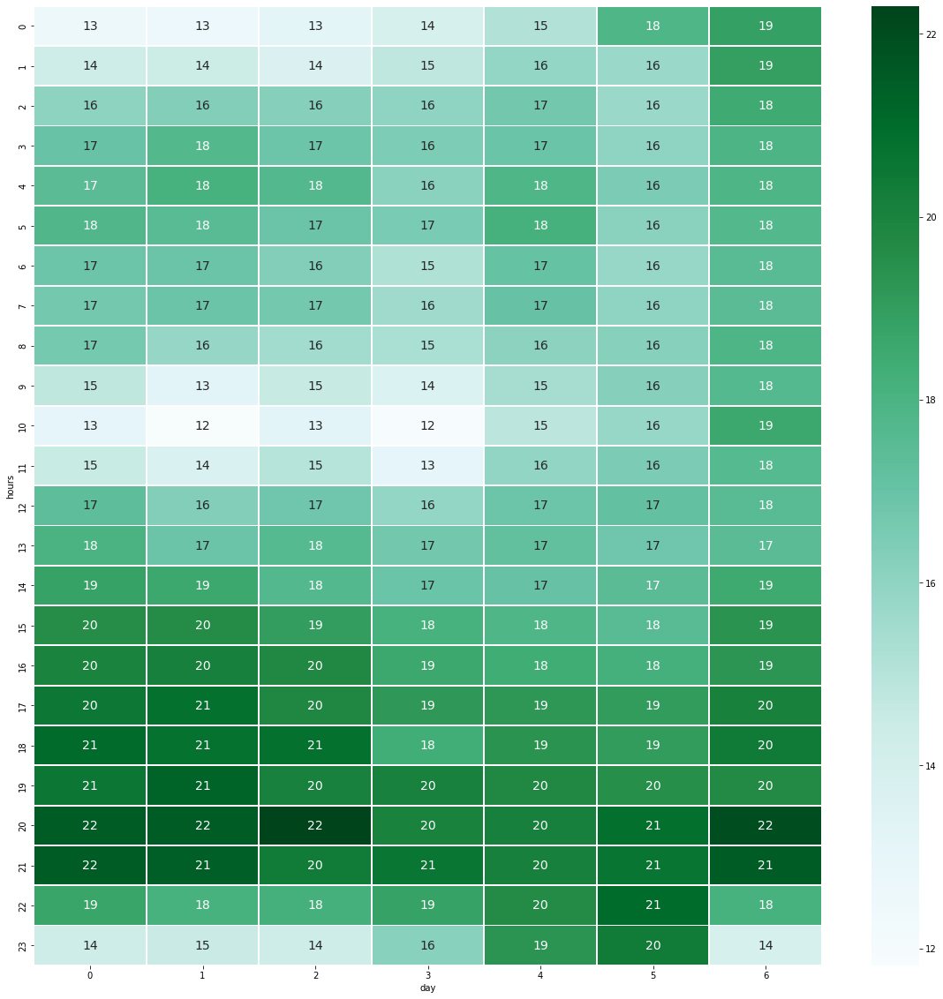

In [135]:
f = plt.figure(figsize=(20, 20))
sb.heatmap(df_altered.groupby(['hours', 'day']).mean().unstack(),
           linewidths = 1, annot = True, annot_kws = {"size": 14}, cmap = "BuGn")